# Conditional Gaussian Multimodal Overview

Compact inspection notebook for the closed-form `CrossModal_ConditionalGaussian` model in a multimodal setting.

This notebook does four things:
- fits the SC to FC conditional Gaussian with covariates included in the conditioning set
- visualizes the joint covariance and correlation blocks in an intuitive multimodal layout
- shows a short math summary in rendered LaTeX
- writes an `eval_test.md` report you can inspect later


In [1]:
import importlib
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

import main
import models.config
import models.eval
import models.lightning_module
import models.loss
import models.latent_attn_masked
import models.conditional_gaussian

importlib.reload(models.loss)
importlib.reload(models.lightning_module)
importlib.reload(models.latent_attn_masked)
importlib.reload(models.conditional_gaussian)
importlib.reload(models.eval)
importlib.reload(models.config)
importlib.reload(main)

from IPython.display import Markdown, display
from main import Sim
from models.config import build_model
from models.loss import get_model_input

RESULTS_ROOT = Path('results/local_results')
RESULTS_ROOT.mkdir(parents=True, exist_ok=True)


In [2]:
def to_np(x):
    if torch.is_tensor(x):
        return x.detach().cpu().numpy()
    return np.asarray(x)


def corr_from_cov(cov):
    cov = to_np(cov)
    std = np.sqrt(np.clip(np.diag(cov), 1e-12, None))
    corr = cov / np.outer(std, std)
    corr[~np.isfinite(corr)] = 0.0
    np.fill_diagonal(corr, 1.0)
    return corr


def source_block_dims(base, cov_sources, source_latent_dim, use_covariates):
    dims = [("SC latent", int(source_latent_dim))]
    if not use_covariates:
        return dims
    for source in cov_sources:
        if source == "age":
            dims.append(("age", int(base.age_z.shape[1])))
        elif source == "sex":
            dims.append(("sex", int(base.sex_oh.shape[1])))
        elif source == "race_eth":
            dims.append(("race_eth", int(base.race_eth_oh.shape[1])))
        elif source == "fs_volumes":
            dims.append(("fs_volumes", int(base.fs_volumes_z.shape[1])))
        elif source == "fs_all":
            dims.append(("fs_all", int(base.fs_features_z.shape[1])))
    return dims


def conditional_gaussian_block_views(diag, base):
    source_blocks = source_block_dims(
        base,
        diag["cov_sources"],
        diag["source_latent_dim"],
        diag["use_covariates"],
    )
    source_total = int(diag["feature_dim"])
    target_total = int(diag["source_latent_dim"])
    if source_total != sum(width for _, width in source_blocks):
        raise ValueError(
            f"Source block widths sum to {sum(width for _, width in source_blocks)} but feature_dim={source_total}."
        )

    Sigma_joint = to_np(diag["Sigma_joint"])
    joint_corr = corr_from_cov(Sigma_joint)

    source_slice = slice(0, source_total)
    target_slice = slice(source_total, source_total + target_total)

    out = {
        "source_blocks": source_blocks,
        "source_total": source_total,
        "target_total": target_total,
        "Sigma_joint": Sigma_joint,
        "joint_corr": joint_corr,
        "Sigma_source": Sigma_joint[source_slice, source_slice],
        "Sigma_target": Sigma_joint[target_slice, target_slice],
        "Sigma_fc_to_rest": Sigma_joint[target_slice, source_slice],
        "corr_source": joint_corr[source_slice, source_slice],
        "corr_target": joint_corr[target_slice, target_slice],
        "corr_fc_to_rest": joint_corr[target_slice, source_slice],
    }
    return out


def plot_conditional_gaussian_blocks(diag, base, title_suffix=""):
    views = conditional_gaussian_block_views(diag, base)
    source_blocks = views["source_blocks"]
    source_total = views["source_total"]
    boundaries = np.cumsum([width for _, width in source_blocks])
    centers = boundaries - np.array([width for _, width in source_blocks]) / 2
    labels = [name for name, _ in source_blocks]

    def add_source_boundaries(ax, color="k"):
        for b in boundaries[:-1]:
            ax.axvline(b - 0.5, color=color, linestyle="--", linewidth=1)
            ax.axhline(b - 0.5, color=color, linestyle="--", linewidth=1)

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    im0 = axes[0, 0].imshow(views["Sigma_joint"], aspect="auto", cmap="coolwarm")
    axes[0, 0].set_title(f"Joint covariance{title_suffix}")
    axes[0, 0].axvline(source_total - 0.5, color="k", linestyle="-", linewidth=1.5)
    axes[0, 0].axhline(source_total - 0.5, color="k", linestyle="-", linewidth=1.5)
    add_source_boundaries(axes[0, 0], color="k")
    plt.colorbar(im0, ax=axes[0, 0], fraction=0.046, pad=0.04)

    im1 = axes[0, 1].imshow(views["joint_corr"], aspect="auto", cmap="RdBu_r", vmin=-1, vmax=1)
    axes[0, 1].set_title(f"Joint correlation{title_suffix}")
    axes[0, 1].axvline(source_total - 0.5, color="k", linestyle="-", linewidth=1.5)
    axes[0, 1].axhline(source_total - 0.5, color="k", linestyle="-", linewidth=1.5)
    add_source_boundaries(axes[0, 1], color="k")
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046, pad=0.04)

    im2 = axes[1, 0].imshow(views["corr_source"], aspect="auto", cmap="RdBu_r", vmin=-1, vmax=1)
    axes[1, 0].set_title(f"Source-side correlation{title_suffix}")
    add_source_boundaries(axes[1, 0], color="k")
    axes[1, 0].set_xticks(centers)
    axes[1, 0].set_xticklabels(labels, rotation=35, ha="right")
    axes[1, 0].set_yticks(centers)
    axes[1, 0].set_yticklabels(labels)
    plt.colorbar(im2, ax=axes[1, 0], fraction=0.046, pad=0.04)

    im3 = axes[1, 1].imshow(views["corr_fc_to_rest"], aspect="auto", cmap="RdBu_r", vmin=-1, vmax=1)
    axes[1, 1].set_title(f"FC-to-rest correlation{title_suffix}")
    for b in boundaries[:-1]:
        axes[1, 1].axvline(b - 0.5, color="k", linestyle="--", linewidth=1)
    axes[1, 1].set_xticks(centers)
    axes[1, 1].set_xticklabels(labels, rotation=35, ha="right")
    axes[1, 1].set_ylabel("FC latent component")
    plt.colorbar(im3, ax=axes[1, 1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    im0 = axes[0, 0].imshow(views["Sigma_source"], aspect="auto", cmap="coolwarm")
    axes[0, 0].set_title(f"Source covariance block{title_suffix}")
    add_source_boundaries(axes[0, 0], color="k")
    axes[0, 0].set_xticks(centers)
    axes[0, 0].set_xticklabels(labels, rotation=35, ha="right")
    axes[0, 0].set_yticks(centers)
    axes[0, 0].set_yticklabels(labels)
    plt.colorbar(im0, ax=axes[0, 0], fraction=0.046, pad=0.04)

    im1 = axes[0, 1].imshow(views["corr_source"], aspect="auto", cmap="RdBu_r", vmin=-1, vmax=1)
    axes[0, 1].set_title(f"Source correlation block{title_suffix}")
    add_source_boundaries(axes[0, 1], color="k")
    axes[0, 1].set_xticks(centers)
    axes[0, 1].set_xticklabels(labels, rotation=35, ha="right")
    axes[0, 1].set_yticks(centers)
    axes[0, 1].set_yticklabels(labels)
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046, pad=0.04)

    im2 = axes[1, 0].imshow(views["Sigma_fc_to_rest"], aspect="auto", cmap="coolwarm")
    axes[1, 0].set_title(f"FC-to-rest covariance block{title_suffix}")
    for b in boundaries[:-1]:
        axes[1, 0].axvline(b - 0.5, color="k", linestyle="--", linewidth=1)
    axes[1, 0].set_xticks(centers)
    axes[1, 0].set_xticklabels(labels, rotation=35, ha="right")
    axes[1, 0].set_ylabel("FC latent component")
    plt.colorbar(im2, ax=axes[1, 0], fraction=0.046, pad=0.04)

    im3 = axes[1, 1].imshow(views["corr_fc_to_rest"], aspect="auto", cmap="RdBu_r", vmin=-1, vmax=1)
    axes[1, 1].set_title(f"FC-to-rest correlation block{title_suffix}")
    for b in boundaries[:-1]:
        axes[1, 1].axvline(b - 0.5, color="k", linestyle="--", linewidth=1)
    axes[1, 1].set_xticks(centers)
    axes[1, 1].set_xticklabels(labels, rotation=35, ha="right")
    axes[1, 1].set_ylabel("FC latent component")
    plt.colorbar(im3, ax=axes[1, 1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    return views


### Performance without covariates

/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


CrossModal_ConditionalGaussian init | domain=pca | src=SC tgt=FC | k=128 | cov_estimator=ledoit_wolf | lambda_ridge=0.001 | zscore_pca_scores=False | use_covariates=False cov_dim=0 | cond(Sigma_11+lamI)=1.316e+01 | shrinkage=0.0937
Number of unique demographic categories: 14
Top-1 accuracy: 0.051  (10 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.707 (chance=0.5)


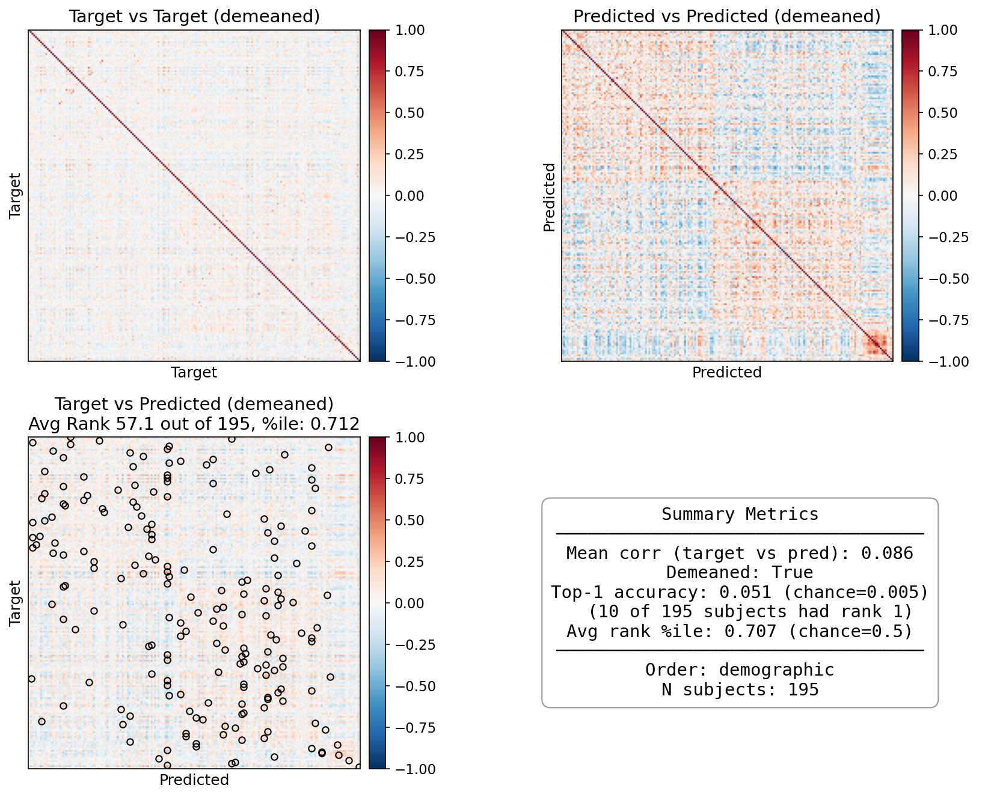

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]


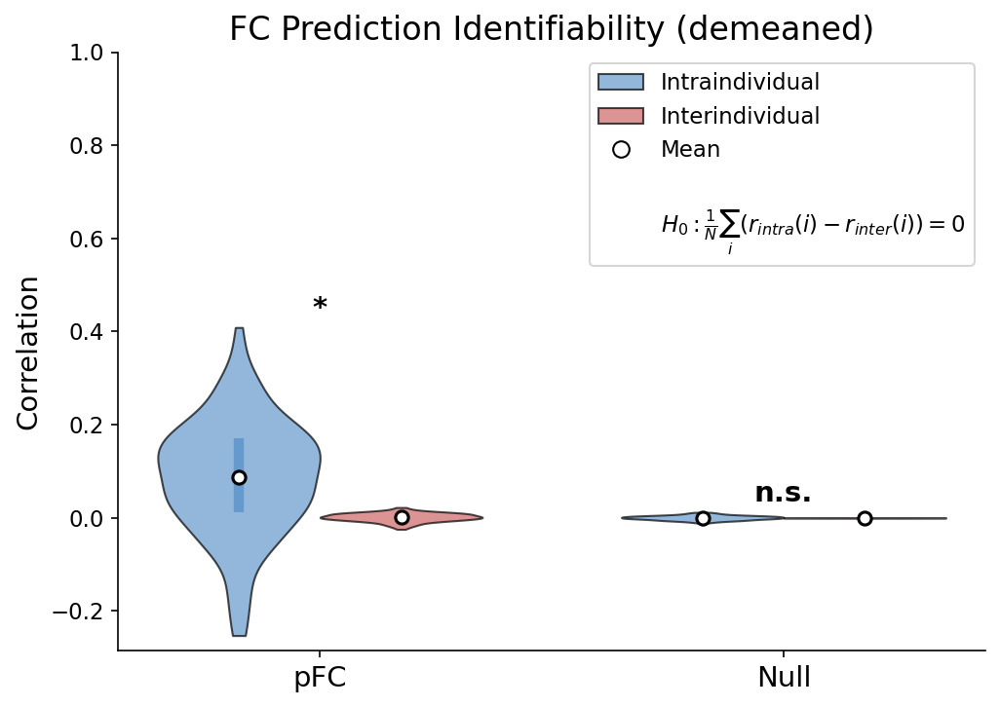


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0863     0.0012     0.0851     9.55       5.81e-18     0.68      
Null         0.0004     -0.0001    0.0005     1.35       1.78e-01     0.10      


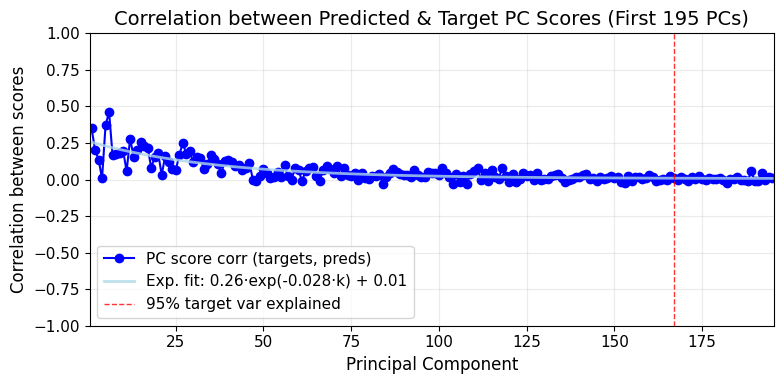

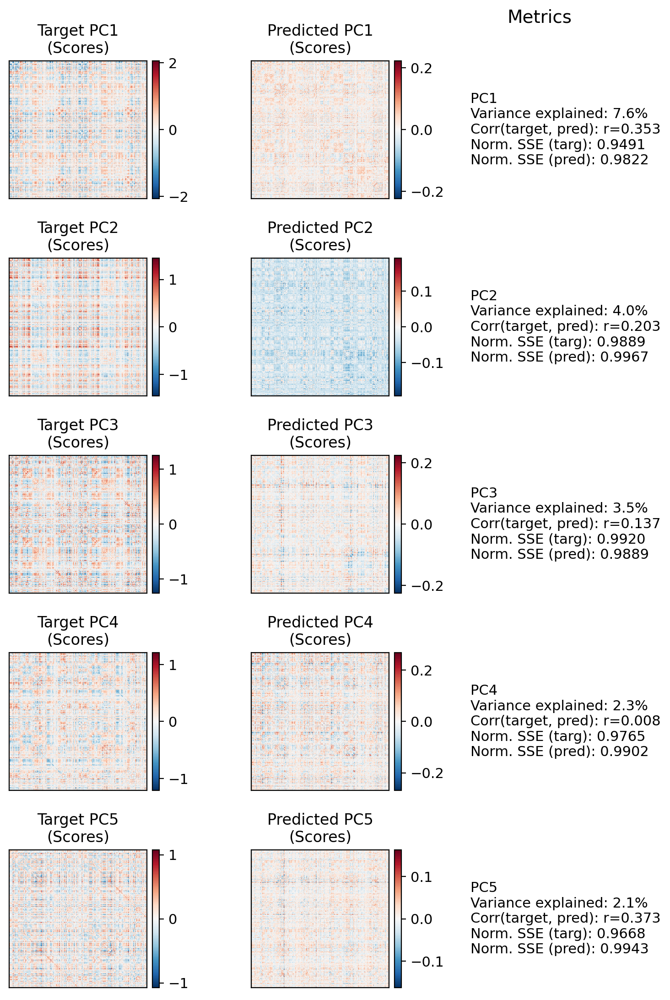

{'mse': np.float32(0.013564102),
 'r2': np.float32(-0.03011259),
 'pearson': np.float32(0.83593905),
 'demeaned_pearson': np.float64(0.08633114282174435),
 'avg_rank': np.float64(0.7166337935568705),
 'top1_acc': np.float64(0.06666666666666667)}

In [3]:
all_cov_sources = ["age", "sex", "race_eth", "fs_volumes"]

config_override = {
    "model": {
        "n_components_pca": 128,
        "lambda_ridge": 1e-3,
        "covariance_estimator": "ledoit_wolf",
        "zscore_pca_scores": False,
        "use_covariates": False,
        "cov_sources": all_cov_sources,
    }
}

sim = Sim(
    model_name="CrossModal_ConditionalGaussian",
    config_overrides=config_override,
    source="SC",
    target="FC",
    parcellation="Glasser",
    shuffle_seed=0,
)

run_out = sim.run_single(
    mode="dev",
    save_checkpoint=False,
    config_override=config_override,
    run_eval=True,
)

run_out["test_metrics"]["base_metrics"]


In [4]:
model = run_out["model"]
diag = model.get_diagnostics()

use_covariates                                   False
cov_sources           [age, sex, race_eth, fs_volumes]
covariate_dim                                        0
condition_number                             13.159844
shrinkage_value                               0.093717
source_feature_dim                                 128
source_latent_dim                                  128
target_latent_dim                                  128
dtype: object


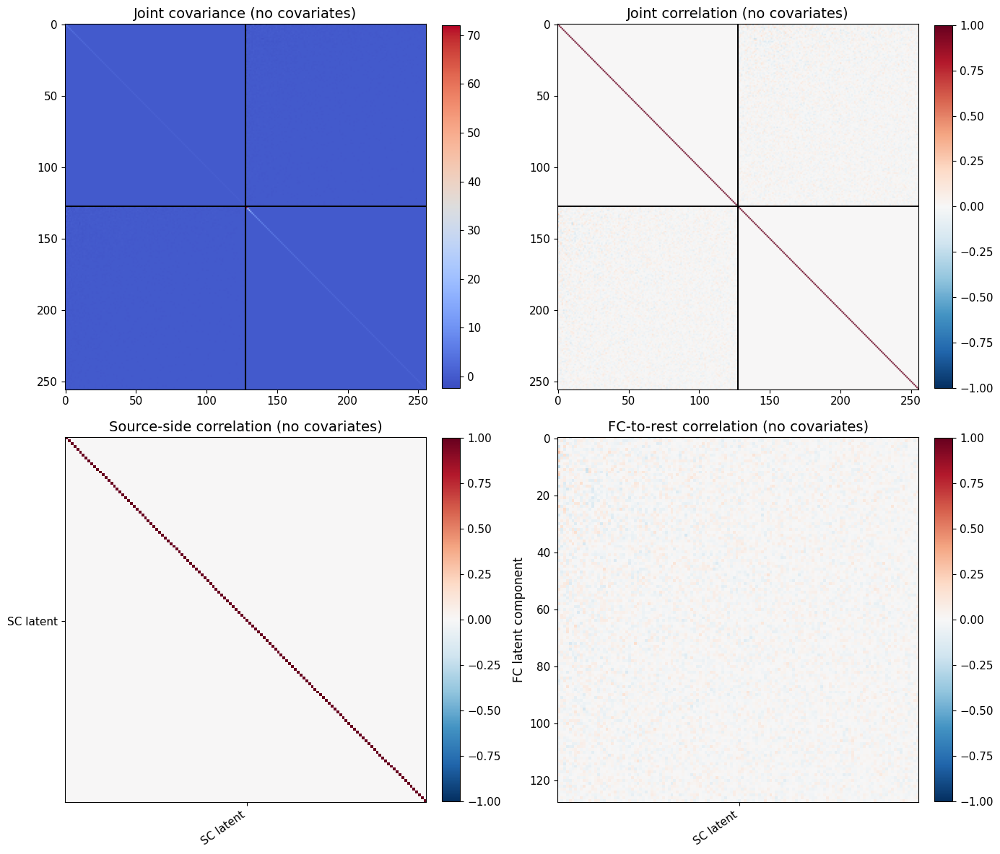

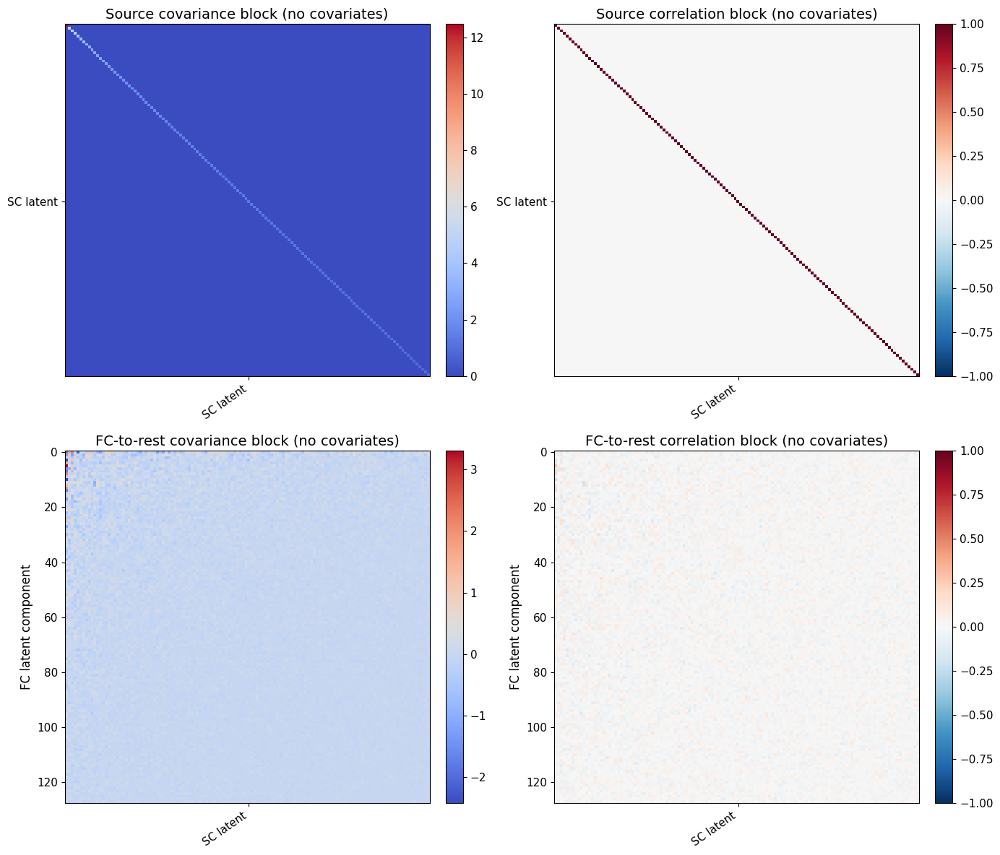

In [5]:
summary = pd.Series({
    "use_covariates": diag["use_covariates"],
    "cov_sources": diag["cov_sources"],
    "covariate_dim": diag["covariate_dim"],
    "condition_number": diag["condition_number"],
    "shrinkage_value": diag["shrinkage_value"],
    "source_feature_dim": diag["feature_dim"],
    "source_latent_dim": diag["source_latent_dim"],
    "target_latent_dim": diag["source_latent_dim"],
})
print(summary)

views = plot_conditional_gaussian_blocks(
    diag,
    sim.base,
    title_suffix=" (no covariates)" if not diag["use_covariates"] else " (with covariates)",
)


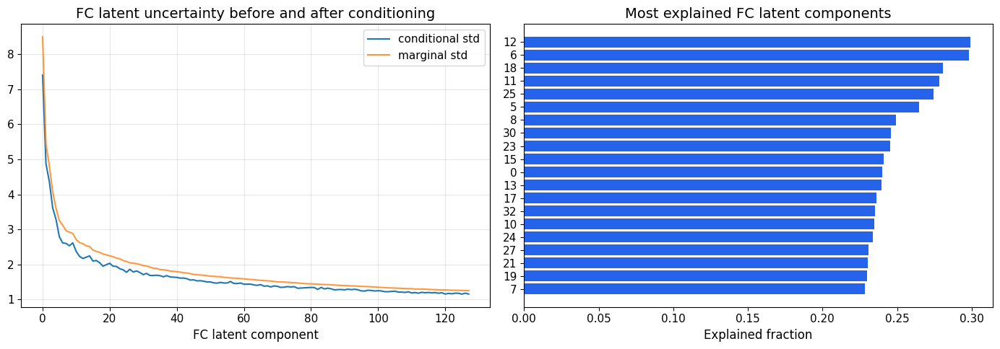

,component,conditional_std,target_marginal_std,explained_fraction
12,12,2.171082,2.593368,0.299151
6,6,2.614515,3.121144,0.298295
18,18,1.951081,2.300387,0.280636
11,11,2.231370,2.626444,0.278217
25,25,1.777736,2.086655,0.274173
5,5,2.787458,3.250262,0.264505
8,8,2.532686,2.923346,0.249411
30,30,1.710995,1.970340,0.245925
23,23,1.878853,2.163044,0.245508
15,15,2.098700,2.408868,0.240943


In [6]:
conditional_std = to_np(diag["conditional_std"])
target_marginal_std = np.sqrt(np.clip(np.diag(to_np(diag["Sigma_22"])), 0.0, None))
explained_fraction = 1.0 - (conditional_std ** 2) / np.clip(target_marginal_std ** 2, 1e-8, None)

uncertainty_df = pd.DataFrame({
    "component": np.arange(len(conditional_std)),
    "conditional_std": conditional_std,
    "target_marginal_std": target_marginal_std,
    "explained_fraction": explained_fraction,
}).sort_values("explained_fraction", ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(conditional_std, label="conditional std")
axes[0].plot(target_marginal_std, label="marginal std", alpha=0.8)
axes[0].set_title("FC latent uncertainty before and after conditioning")
axes[0].set_xlabel("FC latent component")
axes[0].legend()
axes[0].grid(alpha=0.3)

best = uncertainty_df.head(20).sort_values("explained_fraction")
axes[1].barh(best["component"].astype(str), best["explained_fraction"], color="#2563eb")
axes[1].set_title("Most explained FC latent components")
axes[1].set_xlabel("Explained fraction")

plt.tight_layout()
plt.show()

uncertainty_df.head(12)

### Performance with covariates

/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


CrossModal_ConditionalGaussian init | domain=pca | src=SC tgt=FC | k=128 | cov_estimator=ledoit_wolf | lambda_ridge=0.001 | zscore_pca_scores=False | use_covariates=True cov_dim=26 | cond(Sigma_11+lamI)=9.569e+01 | shrinkage=0.0904
Number of unique demographic categories: 14
Top-1 accuracy: 0.036  (7 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.723 (chance=0.5)


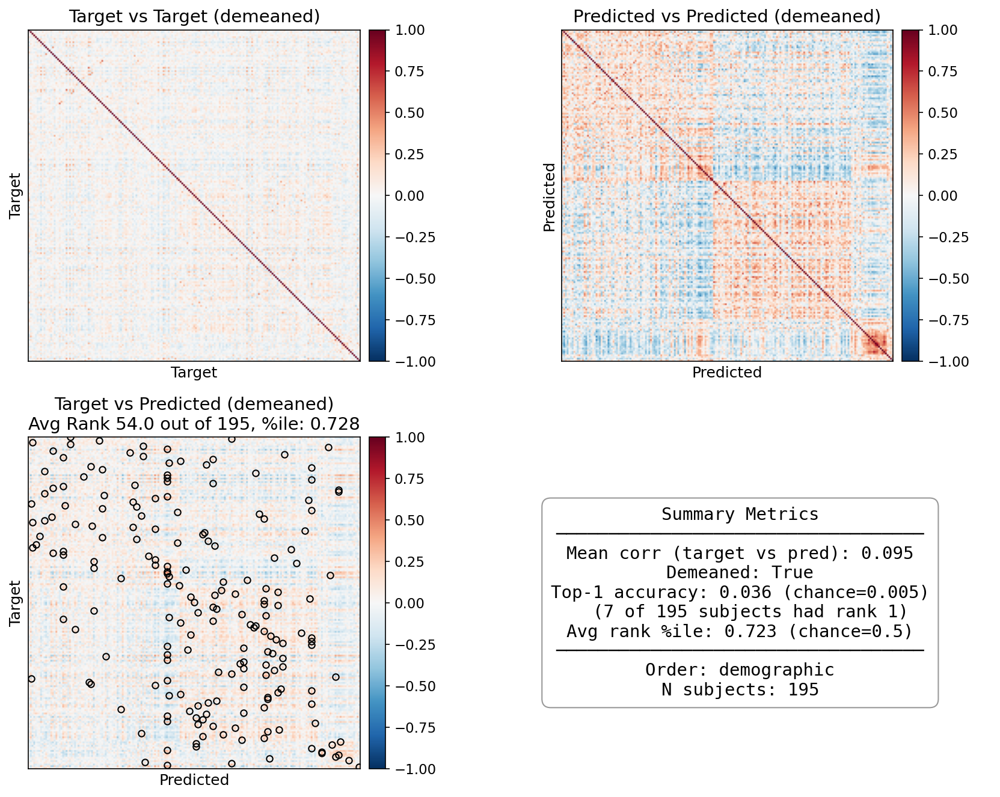

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]


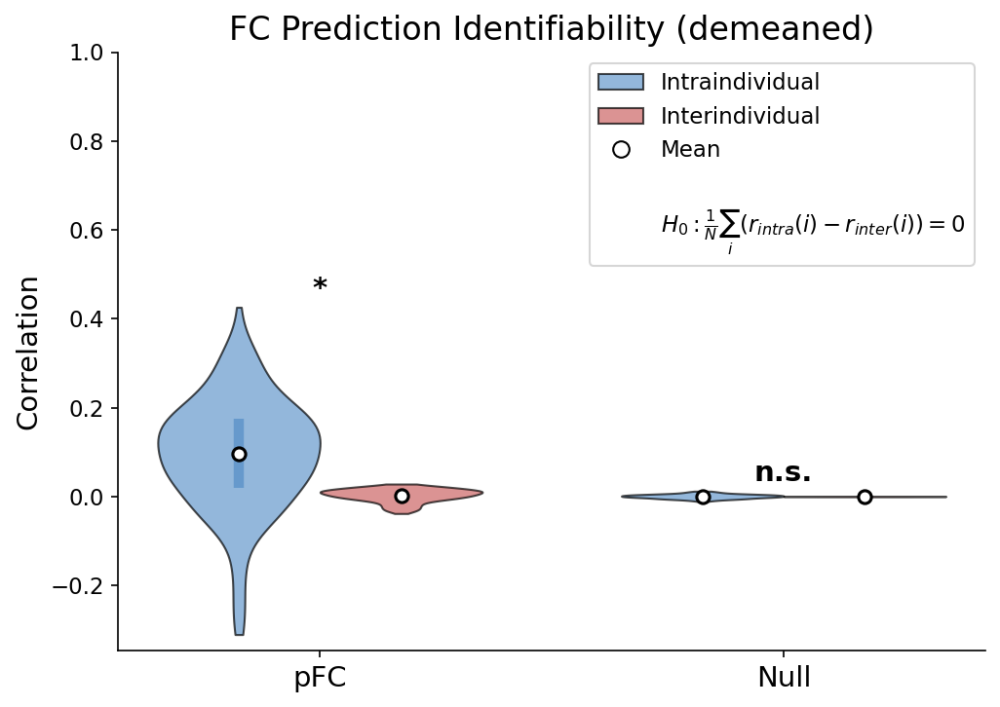


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0952     0.0023     0.0929     10.28      4.46e-20     0.74      
Null         0.0004     -0.0001    0.0005     1.35       1.78e-01     0.10      


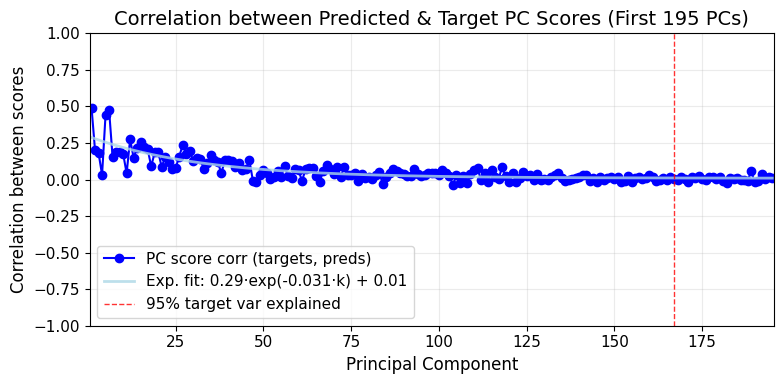

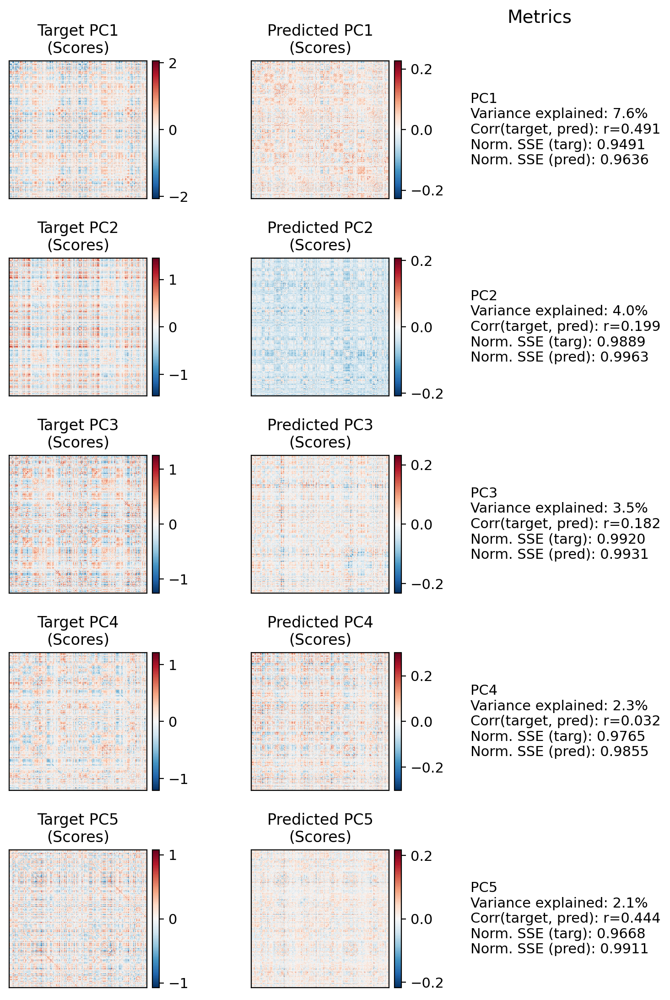

{'mse': np.float32(0.013560083),
 'r2': np.float32(-0.029926376),
 'pearson': np.float32(0.835945),
 'demeaned_pearson': np.float64(0.09518299533512484),
 'avg_rank': np.float64(0.7327021696252465),
 'top1_acc': np.float64(0.05128205128205128)}

In [7]:
config_override = {
    "model": {
        "n_components_pca": 128,
        "lambda_ridge": 1e-3,
        "covariance_estimator": "ledoit_wolf",
        "zscore_pca_scores": False,
        "use_covariates": True,
        "cov_sources": all_cov_sources,
    }
}

sim = Sim(
    model_name="CrossModal_ConditionalGaussian",
    config_overrides=config_override,
    source="SC",
    target="FC",
    parcellation="Glasser",
    shuffle_seed=0,
)

run_out = sim.run_single(
    mode="dev",
    save_checkpoint=False,
    config_override=config_override,
    run_eval=True,
)

run_out["test_metrics"]["base_metrics"]


In [8]:
model = run_out["model"]
diag = model.get_diagnostics()

use_covariates                                    True
cov_sources           [age, sex, race_eth, fs_volumes]
covariate_dim                                       26
condition_number                             95.688794
shrinkage_value                               0.090435
source_feature_dim                                 154
source_latent_dim                                  128
target_latent_dim                                  128
dtype: object


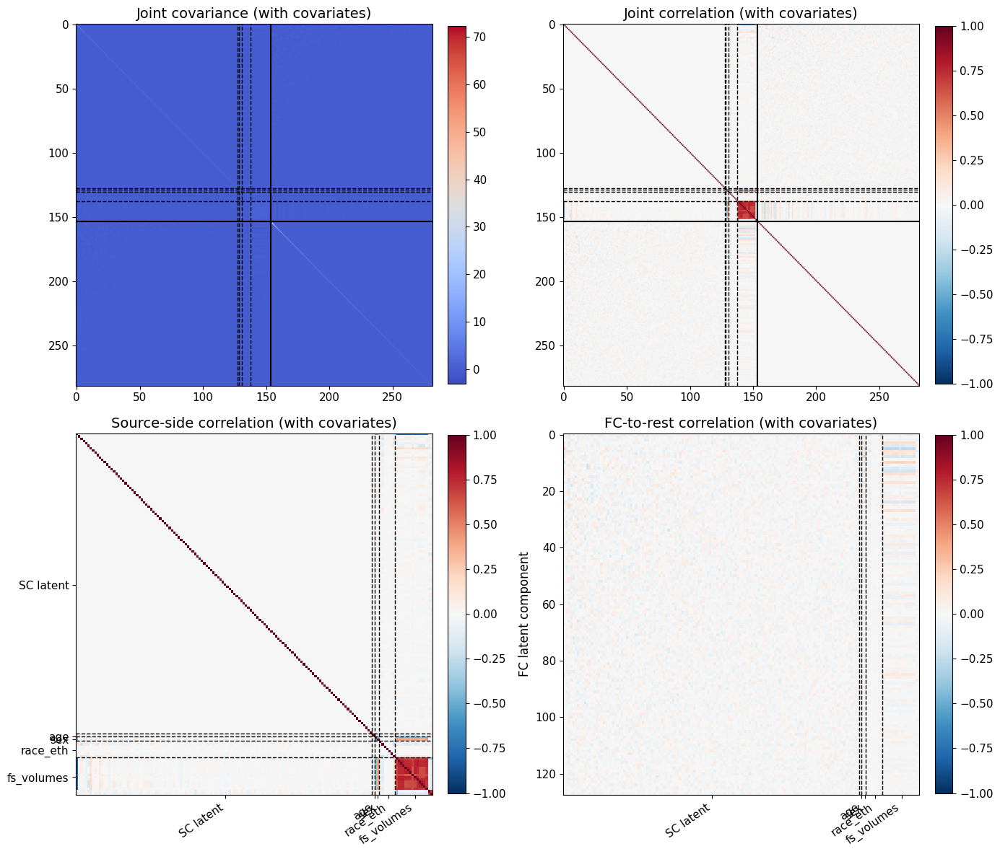

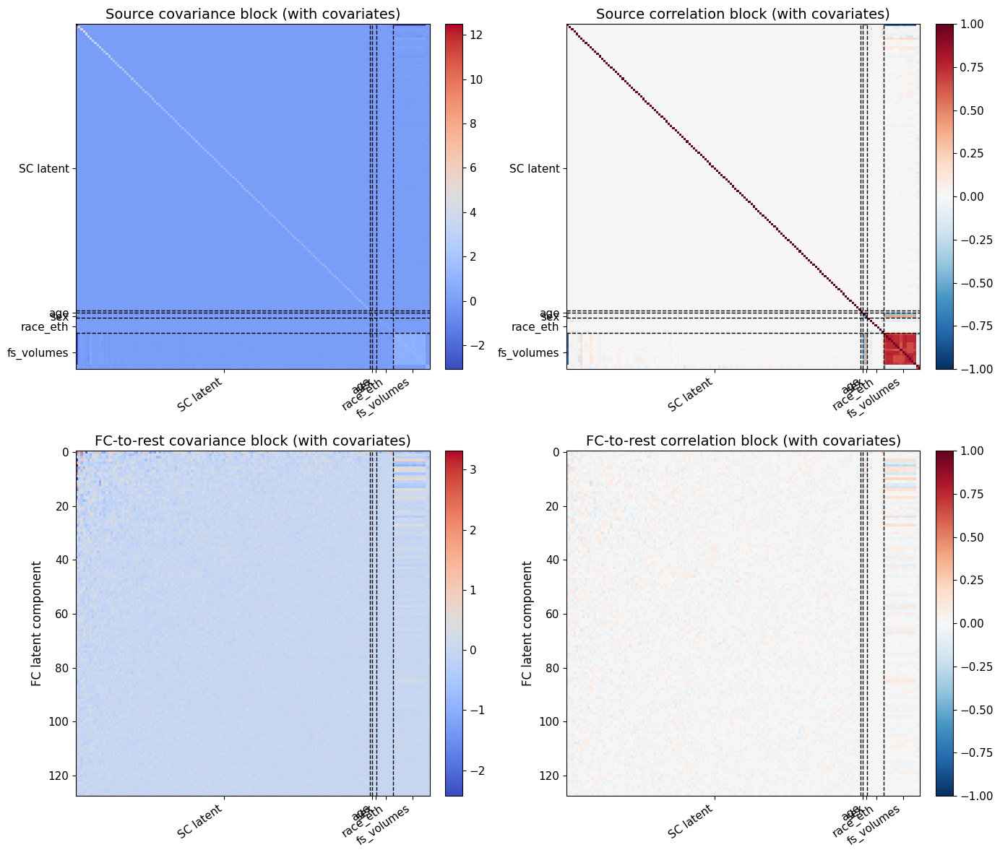

In [9]:
summary = pd.Series({
    "use_covariates": diag["use_covariates"],
    "cov_sources": diag["cov_sources"],
    "covariate_dim": diag["covariate_dim"],
    "condition_number": diag["condition_number"],
    "shrinkage_value": diag["shrinkage_value"],
    "source_feature_dim": diag["feature_dim"],
    "source_latent_dim": diag["source_latent_dim"],
    "target_latent_dim": diag["source_latent_dim"],
})
print(summary)

views = plot_conditional_gaussian_blocks(
    diag,
    sim.base,
    title_suffix=" (no covariates)" if not diag["use_covariates"] else " (with covariates)",
)


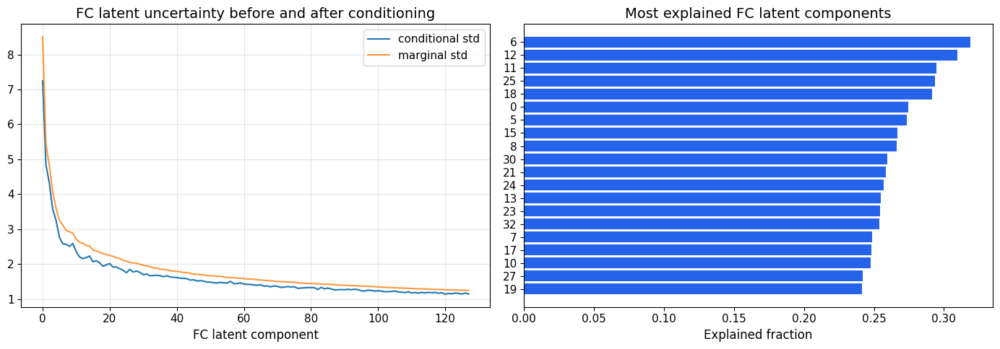

,component,conditional_std,target_marginal_std,explained_fraction
6,6,2.576535,3.122122,0.318960
12,12,2.154004,2.592439,0.309639
11,11,2.205149,2.625646,0.294652
25,25,1.751198,2.083441,0.293507
18,18,1.934269,2.298211,0.291640
0,0,7.244468,8.505909,0.274610
5,5,2.771273,3.251660,0.273646
15,15,2.061063,2.407175,0.266893
8,8,2.504600,2.923650,0.266118
30,30,1.692475,1.966502,0.259277


In [10]:
conditional_std = to_np(diag["conditional_std"])
target_marginal_std = np.sqrt(np.clip(np.diag(to_np(diag["Sigma_22"])), 0.0, None))
explained_fraction = 1.0 - (conditional_std ** 2) / np.clip(target_marginal_std ** 2, 1e-8, None)

uncertainty_df = pd.DataFrame({
    "component": np.arange(len(conditional_std)),
    "conditional_std": conditional_std,
    "target_marginal_std": target_marginal_std,
    "explained_fraction": explained_fraction,
}).sort_values("explained_fraction", ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(conditional_std, label="conditional std")
axes[0].plot(target_marginal_std, label="marginal std", alpha=0.8)
axes[0].set_title("FC latent uncertainty before and after conditioning")
axes[0].set_xlabel("FC latent component")
axes[0].legend()
axes[0].grid(alpha=0.3)

best = uncertainty_df.head(20).sort_values("explained_fraction")
axes[1].barh(best["component"].astype(str), best["explained_fraction"], color="#2563eb")
axes[1].set_title("Most explained FC latent components")
axes[1].set_xlabel("Explained fraction")

plt.tight_layout()
plt.show()

uncertainty_df.head(12)


## Math Summary

Yes, Jupyter markdown supports LaTeX, so this cell should render directly.

We form a joint Gaussian over source-side features and target latents:

$$
\begin{bmatrix}
z_s \\
z_t
\end{bmatrix}
\sim \mathcal{N}
\left(
\begin{bmatrix}
\mu_s \\
\mu_t
\end{bmatrix},
\begin{bmatrix}
\Sigma_{11} & \Sigma_{12} \\
\Sigma_{21} & \Sigma_{22}
\end{bmatrix}
\right)
$$

In the multimodal notebook, the source-side vector is really

$$
z_s = [z_{SC}; c_{age}; c_{sex}; c_{race}; c_{FS}],
$$

so the source covariance block includes both SC latent structure and covariate structure.

The conditional mean used for prediction is

$$
\mathbb{E}[z_t \mid z_s] = \mu_t + \Sigma_{21}(\Sigma_{11} + \lambda I)^{-1}(z_s - \mu_s)
$$

which we write as

$$
\hat z_t = W z_s + b.
$$

The remaining uncertainty is described by

$$
\Sigma_{t \mid s} = \Sigma_{22} - \Sigma_{21}(\Sigma_{11} + \lambda I)^{-1}\Sigma_{12}.
$$

For FC latent component $i$, the notebook summaries are just diagonal summaries of this conditional covariance:

$$
\texttt{conditional\_std}_i = \sqrt{\mathrm{Var}(z_{t,i} \mid z_s)}
$$

This is the residual standard deviation left after conditioning on SC and any covariates. Smaller means that component is more tightly determined by the observed source-side features.

$$
\texttt{target\_marginal\_std}_i = \sqrt{\mathrm{Var}(z_{t,i})}
$$

This is the unconditional spread of FC latent component $i$ before seeing SC or covariates.

$$
\texttt{explained\_fraction}_i = 1 - \frac{\mathrm{Var}(z_{t,i} \mid z_s)}{\mathrm{Var}(z_{t,i})}
$$

So:

- `explained_fraction` near `1` means the source-side variables explain most of that FC latent component.
- `explained_fraction` near `0` means conditioning does little beyond the marginal FC variance.
- negative values can happen numerically or under weak estimation and mean the fitted conditional variance is slightly larger than the estimated marginal variance for that component.

Equivalently, if you compare the two standard deviations directly,

$$
\frac{\texttt{conditional\_std}_i}{\texttt{target\_marginal\_std}_i}
$$

is the fraction of the original uncertainty that remains after conditioning.


In [11]:
artifact_dir = RESULTS_ROOT / "conditional_gaussian_multimodal_overview"
artifact_dir.mkdir(parents=True, exist_ok=True)
report_base = artifact_dir / "eval_test"

test_eval = run_out["evaluators"]["test"]
report_metrics = test_eval.analyze_results(
    verbose=False,
    filepath=str(report_base),
    output_format="md",
    model_name="CrossModal_ConditionalGaussian_multimodal",
)

print(f"Markdown report saved to: {report_base}.md")
report_metrics["base_metrics"]


Number of unique demographic categories: 14
returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]
Markdown report saved to: results/local_results/conditional_gaussian_multimodal_overview/eval_test.md
Figures saved to: results/local_results/conditional_gaussian_multimodal_overview/eval_test_plots/
Markdown report saved to: results/local_results/conditional_gaussian_multimodal_overview/eval_test.md


{'mse': np.float32(0.013560083),
 'r2': np.float32(-0.029926376),
 'pearson': np.float32(0.835945),
 'demeaned_pearson': np.float64(0.09518299533512484),
 'avg_rank': np.float64(0.7327021696252465),
 'top1_acc': np.float64(0.05128205128205128)}